## Codes for APMA 6901 Final Project

Solving the ARZ model
$$ 
\begin{cases}
\rho_t+(\rho u)_x=0\\
[u+h(\rho)]_t+u[u+h(\rho)]_x=0
\end{cases}
$$

Its standard form is:
$$ \mathbf{q}_t+\mathbf{f}(\mathbf{q})_x=\mathbf{\psi}(\mathbf{q}) $$
where
$$
\mathbf{q}=\begin{bmatrix} \rho \\ y \end{bmatrix},\quad
\mathbf{f}(\mathbf{q})=\begin{bmatrix} y-\rho h(\rho) \\ y^2/\rho-yh(\rho) \end{bmatrix},\quad
\mathbf{\psi}(\mathbf{q})=\begin{bmatrix} 0 \\ \frac1\tau (Q(\rho)-y+\rho h(\rho) \end{bmatrix}
$$
with $y=\rho[u+h(\rho)]$.

In the numerical examples:
$$ h(\rho)=\beta \sqrt{\frac{\rho}{1-\rho}},\quad U(\rho)=1-\rho,\quad Q(\rho)=\rho U(\rho)=\rho(1-\rho) $$
and $\tau=1$, $\beta=0.1$.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML
from clawpack import pyclaw
import utils
import rp_solvers

## Riemann solvers

The exact and approximate Riemann solvers are developed to solve the Riemann problem. For the exact Riemann solver, the intermediate state $\mathbf{q}_m$ between the left state $\mathbf{q}_l$ and right state $\mathbf{q}_r$ is computed from:
$$ u_l+h(\rho_l)=u_m+h(\rho_m),\quad u_m=u_r $$
The figure below provides a graphical illustration.

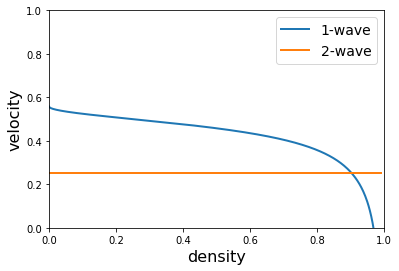

In [2]:
def riemann_illus(u_l, rho_l, u_r):
    plt.figure()
    rho = np.linspace(0, .99, 500)
    u = u_l + utils.pressure(rho_l) - utils.pressure(rho)
    plt.plot(rho, u, lw=2, label='1-wave')
    plt.plot(rho, u_r*np.ones(500), lw=2, label='2-wave')
    plt.xlim([0,1])
    plt.ylim([0,1])
    plt.xlabel('density', size=16)
    plt.ylabel('velocity', size=16)
    plt.legend(fontsize=14)
    plt.show()

u_l = 0.5
rho_l = 0.25
u_r = 0.25
riemann_illus(u_l, rho_l, u_r)

## Finite volume methods

The Godunov method, the HLL method and their high-resolution extensions are designed and tested.

In [3]:
def solve(rp_solver, rho_ini, u_ini, bc="extrap", tfinal=2, order=1, relax=True):
    solver = pyclaw.ClawSolver1D(rp_solver)
    solver.kernel_language = "Python"
    solver.num_eqn = 2
    solver.num_waves = 2
    solver.order = order
    solver.limiters = pyclaw.limiters.tvd.MC
    if bc == "extrap":
        solver.bc_lower[0] = pyclaw.BC.extrap
        solver.bc_upper[0] = pyclaw.BC.extrap
    elif bc == "periodic":
        solver.bc_lower[0] = pyclaw.BC.periodic
        solver.bc_upper[0] = pyclaw.BC.periodic
    else:
        raise ValueError("Invalid boundary condition type.")
    if relax:
        solver.step_source = utils.step_relaxation
    
    num_cells = rho_ini.shape[0]
    x = pyclaw.Dimension(0, 1, num_cells, name='x')
    domain = pyclaw.Domain([x])
    state = pyclaw.State(domain, solver.num_eqn)
    state.q[0,:] = rho_ini
    state.q[1,:] = rho_ini * (u_ini + utils.pressure(rho_ini))
    
    claw = pyclaw.Controller()
    claw.solution = pyclaw.Solution(state, domain)
    claw.solver = solver
    claw.tfinal = tfinal
    claw.num_output_times = 10 * tfinal
    
    claw.keep_copy = True
    claw.run()
    return claw

In [4]:
def anim(claw):
    x = claw.frames[0].grid.dimensions[0].centers
    
    fig = plt.figure()
    
    def init():
        rho_ini = claw.frames[0].q[0]
        y_ini = claw.frames[0].q[1]
        u_ini = y_ini / rho_ini - utils.pressure(rho_ini)
        density_line, = plt.plot(x, rho_ini, 'b', lw=2, label='density')
        velocity_line, = plt.plot(x, u_ini, 'r', lw=2, label='velocity')
        plt.xlim((0, 1))
        plt.ylim((0, 1))
        plt.xlabel('x')
        plt.legend()
        ax = plt.axes()
        title_line = ax.text(.5, 1.05, '', transform=ax.transAxes, fontdict={'fontsize':18})
        return (density_line, velocity_line, title_line)
    
    density_line, velocity_line, title_line = init()
    
    def fplot(n):
        rho = claw.frames[n].q[0]
        y = claw.frames[n].q[1]
        u = y / rho - utils.pressure(rho)
        density_line.set_data([x,], [rho,])
        velocity_line.set_data([x,], [u,])
        title_line.set_text("t = %.1f" % claw.frames[n].t)
        return (density_line, velocity_line, title_line)

    frames_to_plot = range(0, len(claw.frames))
    plt.close(fig)
    return animation.FuncAnimation(fig, fplot, frames=frames_to_plot, interval=100, init_func=init, repeat=False)

## Test case 1
Take the Riemann initial data:
$$ 
\rho(x,0)=\begin{cases} 0.25,\quad &x<0.5\\0.5,\quad &x>0.5 \end{cases},\quad
u(x,0)=\begin{cases} 0.5,\quad &x<0.5\\0.25,\quad &x>0.5 \end{cases},\quad
$$
and assume the extrapolation boundary conditions.

In [5]:
num_cells = 200
rho_ini, u_ini = utils.get_initial_data(num_cells, 'rp')

### Godunov

In [6]:
claw = solve(rp_solvers.riemann, rho_ini, u_ini, tfinal=2)

2019-12-15 20:47:05,559 INFO CLAW: Solution 0 computed for time t=0.000000
2019-12-15 20:47:05,593 INFO CLAW: Solution 1 computed for time t=0.100000
2019-12-15 20:47:05,635 INFO CLAW: Solution 2 computed for time t=0.200000
2019-12-15 20:47:05,693 INFO CLAW: Solution 3 computed for time t=0.300000
2019-12-15 20:47:05,741 INFO CLAW: Solution 4 computed for time t=0.400000


/home/kuang/anaconda2/lib/python2.7/site-packages/h5py/__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


2019-12-15 20:47:05,838 INFO CLAW: Solution 5 computed for time t=0.500000
2019-12-15 20:47:05,898 INFO CLAW: Solution 6 computed for time t=0.600000
2019-12-15 20:47:05,964 INFO CLAW: Solution 7 computed for time t=0.700000
2019-12-15 20:47:06,056 INFO CLAW: Solution 8 computed for time t=0.800000
2019-12-15 20:47:06,230 INFO CLAW: Solution 9 computed for time t=0.900000
2019-12-15 20:47:06,442 INFO CLAW: Solution 10 computed for time t=1.000000
2019-12-15 20:47:06,569 INFO CLAW: Solution 11 computed for time t=1.100000
2019-12-15 20:47:06,667 INFO CLAW: Solution 12 computed for time t=1.200000
2019-12-15 20:47:06,787 INFO CLAW: Solution 13 computed for time t=1.300000
2019-12-15 20:47:06,923 INFO CLAW: Solution 14 computed for time t=1.400000
2019-12-15 20:47:07,106 INFO CLAW: Solution 15 computed for time t=1.500000
2019-12-15 20:47:07,307 INFO CLAW: Solution 16 computed for time t=1.600000
2019-12-15 20:47:07,519 INFO CLAW: Solution 17 computed for time t=1.700000
2019-12-15 20:47:

/home/kuang/anaconda2/lib/python2.7/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


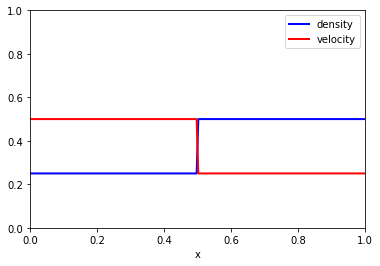

In [7]:
HTML(anim(claw).to_jshtml())

### High Resolution Godunov

In [8]:
claw = solve(rp_solvers.riemann, rho_ini, u_ini, tfinal=2, order=2)

2019-12-15 20:47:08,884 INFO CLAW: Solution 0 computed for time t=0.000000
2019-12-15 20:47:08,924 INFO CLAW: Solution 1 computed for time t=0.100000
2019-12-15 20:47:08,997 INFO CLAW: Solution 2 computed for time t=0.200000
2019-12-15 20:47:09,067 INFO CLAW: Solution 3 computed for time t=0.300000
2019-12-15 20:47:09,146 INFO CLAW: Solution 4 computed for time t=0.400000
2019-12-15 20:47:09,231 INFO CLAW: Solution 5 computed for time t=0.500000
2019-12-15 20:47:09,324 INFO CLAW: Solution 6 computed for time t=0.600000
2019-12-15 20:47:09,426 INFO CLAW: Solution 7 computed for time t=0.700000
2019-12-15 20:47:09,566 INFO CLAW: Solution 8 computed for time t=0.800000
2019-12-15 20:47:09,747 INFO CLAW: Solution 9 computed for time t=0.900000
2019-12-15 20:47:09,903 INFO CLAW: Solution 10 computed for time t=1.000000
2019-12-15 20:47:10,073 INFO CLAW: Solution 11 computed for time t=1.100000
2019-12-15 20:47:10,229 INFO CLAW: Solution 12 computed for time t=1.200000
2019-12-15 20:47:10,38

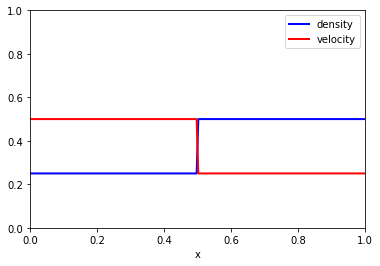

In [9]:
HTML(anim(claw).to_jshtml())

### HLL

In [10]:
claw = solve(rp_solvers.hll, rho_ini, u_ini, tfinal=2)

2019-12-15 20:47:14,012 INFO CLAW: Solution 0 computed for time t=0.000000
2019-12-15 20:47:14,019 INFO CLAW: Solution 1 computed for time t=0.100000
2019-12-15 20:47:14,030 INFO CLAW: Solution 2 computed for time t=0.200000
2019-12-15 20:47:14,040 INFO CLAW: Solution 3 computed for time t=0.300000
2019-12-15 20:47:14,050 INFO CLAW: Solution 4 computed for time t=0.400000
2019-12-15 20:47:14,059 INFO CLAW: Solution 5 computed for time t=0.500000
2019-12-15 20:47:14,069 INFO CLAW: Solution 6 computed for time t=0.600000
2019-12-15 20:47:14,079 INFO CLAW: Solution 7 computed for time t=0.700000
2019-12-15 20:47:14,090 INFO CLAW: Solution 8 computed for time t=0.800000
2019-12-15 20:47:14,104 INFO CLAW: Solution 9 computed for time t=0.900000
2019-12-15 20:47:14,120 INFO CLAW: Solution 10 computed for time t=1.000000
2019-12-15 20:47:14,150 INFO CLAW: Solution 11 computed for time t=1.100000
2019-12-15 20:47:14,201 INFO CLAW: Solution 12 computed for time t=1.200000
2019-12-15 20:47:14,24

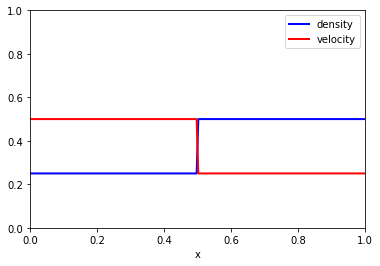

In [11]:
HTML(anim(claw).to_jshtml())

### High Resolution HLL

In [12]:
claw = solve(rp_solvers.hll, rho_ini, u_ini, tfinal=2, order=2)

2019-12-15 20:47:15,906 INFO CLAW: Solution 0 computed for time t=0.000000
2019-12-15 20:47:15,920 INFO CLAW: Solution 1 computed for time t=0.100000
2019-12-15 20:47:15,935 INFO CLAW: Solution 2 computed for time t=0.200000
2019-12-15 20:47:15,955 INFO CLAW: Solution 3 computed for time t=0.300000
2019-12-15 20:47:15,979 INFO CLAW: Solution 4 computed for time t=0.400000
2019-12-15 20:47:16,005 INFO CLAW: Solution 5 computed for time t=0.500000
2019-12-15 20:47:16,032 INFO CLAW: Solution 6 computed for time t=0.600000
2019-12-15 20:47:16,072 INFO CLAW: Solution 7 computed for time t=0.700000
2019-12-15 20:47:16,137 INFO CLAW: Solution 8 computed for time t=0.800000
2019-12-15 20:47:16,200 INFO CLAW: Solution 9 computed for time t=0.900000
2019-12-15 20:47:16,264 INFO CLAW: Solution 10 computed for time t=1.000000
2019-12-15 20:47:16,339 INFO CLAW: Solution 11 computed for time t=1.100000
2019-12-15 20:47:16,421 INFO CLAW: Solution 12 computed for time t=1.200000
2019-12-15 20:47:16,54

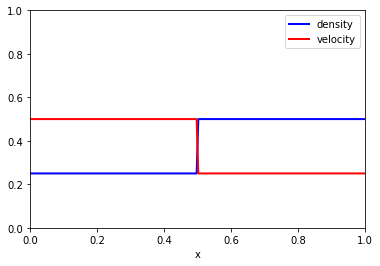

In [13]:
HTML(anim(claw).to_jshtml())

We observe that all four methods work well. The initial Riemann data generates a shock wave.

## Test case 2
Take the Riemann initial data:
$$ 
\rho(x,0)=\begin{cases} 0.25,\quad &x<0.5\\0.75,\quad &x>0.5 \end{cases},\quad
u(x,0)=0.5
$$
and assume the extrapolation boundary conditions. In this case we remove the relaxation term and solve the homogeneous ARZ model.

In [14]:
num_cells = 200
rho_ini, u_ini = utils.get_initial_data(num_cells, 'contact')

### Godunov

In [15]:
claw = solve(rp_solvers.riemann, rho_ini, u_ini, tfinal=2, relax=False)

2019-12-15 20:47:18,888 INFO CLAW: Solution 0 computed for time t=0.000000
2019-12-15 20:47:18,923 INFO CLAW: Solution 1 computed for time t=0.100000
2019-12-15 20:47:18,961 INFO CLAW: Solution 2 computed for time t=0.200000
2019-12-15 20:47:18,992 INFO CLAW: Solution 3 computed for time t=0.300000
2019-12-15 20:47:19,032 INFO CLAW: Solution 4 computed for time t=0.400000
2019-12-15 20:47:19,076 INFO CLAW: Solution 5 computed for time t=0.500000
2019-12-15 20:47:19,131 INFO CLAW: Solution 6 computed for time t=0.600000
2019-12-15 20:47:19,180 INFO CLAW: Solution 7 computed for time t=0.700000
2019-12-15 20:47:19,228 INFO CLAW: Solution 8 computed for time t=0.800000
2019-12-15 20:47:19,271 INFO CLAW: Solution 9 computed for time t=0.900000
2019-12-15 20:47:19,321 INFO CLAW: Solution 10 computed for time t=1.000000
2019-12-15 20:47:19,361 INFO CLAW: Solution 11 computed for time t=1.100000
2019-12-15 20:47:19,398 INFO CLAW: Solution 12 computed for time t=1.200000
2019-12-15 20:47:19,44

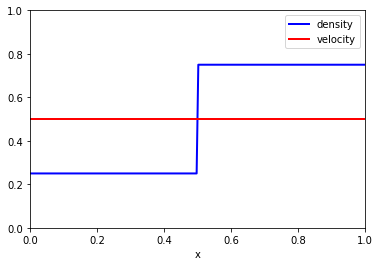

In [16]:
HTML(anim(claw).to_jshtml())

### High Resolution Godunov

In [17]:
claw = solve(rp_solvers.riemann, rho_ini, u_ini, tfinal=2, order=2, relax=False)

2019-12-15 20:47:20,704 INFO CLAW: Solution 0 computed for time t=0.000000


ValueError: There exist vacuum problems.

### HLL

In [18]:
claw = solve(rp_solvers.hll, rho_ini, u_ini, tfinal=2, relax=False)

2019-12-15 20:47:55,912 INFO CLAW: Solution 0 computed for time t=0.000000
2019-12-15 20:47:55,919 INFO CLAW: Solution 1 computed for time t=0.100000
2019-12-15 20:47:55,935 INFO CLAW: Solution 2 computed for time t=0.200000
2019-12-15 20:47:55,945 INFO CLAW: Solution 3 computed for time t=0.300000
2019-12-15 20:47:55,956 INFO CLAW: Solution 4 computed for time t=0.400000
2019-12-15 20:47:55,969 INFO CLAW: Solution 5 computed for time t=0.500000
2019-12-15 20:47:55,982 INFO CLAW: Solution 6 computed for time t=0.600000
2019-12-15 20:47:55,997 INFO CLAW: Solution 7 computed for time t=0.700000
2019-12-15 20:47:56,008 INFO CLAW: Solution 8 computed for time t=0.800000
2019-12-15 20:47:56,023 INFO CLAW: Solution 9 computed for time t=0.900000
2019-12-15 20:47:56,038 INFO CLAW: Solution 10 computed for time t=1.000000
2019-12-15 20:47:56,054 INFO CLAW: Solution 11 computed for time t=1.100000
2019-12-15 20:47:56,072 INFO CLAW: Solution 12 computed for time t=1.200000
2019-12-15 20:47:56,09

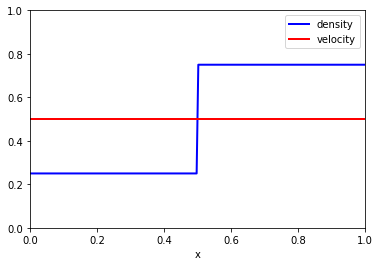

In [19]:
HTML(anim(claw).to_jshtml())

### High Resolution HLL

In [20]:
claw = solve(rp_solvers.hll, rho_ini, u_ini, tfinal=2, order=2, relax=False)

2019-12-15 20:48:04,872 INFO CLAW: Solution 0 computed for time t=0.000000
2019-12-15 20:48:04,885 INFO CLAW: Solution 1 computed for time t=0.100000
2019-12-15 20:48:04,898 INFO CLAW: Solution 2 computed for time t=0.200000
2019-12-15 20:48:04,911 INFO CLAW: Solution 3 computed for time t=0.300000
2019-12-15 20:48:04,930 INFO CLAW: Solution 4 computed for time t=0.400000
2019-12-15 20:48:04,948 INFO CLAW: Solution 5 computed for time t=0.500000
2019-12-15 20:48:04,968 INFO CLAW: Solution 6 computed for time t=0.600000
2019-12-15 20:48:04,990 INFO CLAW: Solution 7 computed for time t=0.700000
2019-12-15 20:48:05,013 INFO CLAW: Solution 8 computed for time t=0.800000
2019-12-15 20:48:05,035 INFO CLAW: Solution 9 computed for time t=0.900000
2019-12-15 20:48:05,059 INFO CLAW: Solution 10 computed for time t=1.000000
2019-12-15 20:48:05,083 INFO CLAW: Solution 11 computed for time t=1.100000
2019-12-15 20:48:05,105 INFO CLAW: Solution 12 computed for time t=1.200000
2019-12-15 20:48:05,12

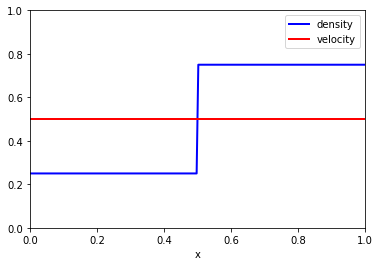

In [21]:
HTML(anim(claw).to_jshtml())

When there is no relaxation term, the model's exact solution is a moving contact discontinuity. We observe that both the Godunov and HLL methods work not so well. They both produce oscillations near the discontinuity. For the high-resolution methods, the high-resolution Godunov fails because a vacuum problem forms; the high-resolution HLL can work but produces very high oscillations near the discontinuity.

## Test case 3
Take the bellshape initial density and constant initial speed:
$$ 
\rho(x,0)=0.25+0.5e^{-100(x-0.5)^2},\quad
u(x,0)=0.5
$$
and assume the periodic boundary conditions. In this case we simulate the model for a longer time.

In [22]:
num_cells = 200
rho_ini, u_ini = utils.get_initial_data(num_cells, 'bell')

### Godunov

In [23]:
claw = solve(rp_solvers.riemann, rho_ini, u_ini, bc="periodic", tfinal=10)

2019-12-15 20:48:24,907 INFO CLAW: Solution 0 computed for time t=0.000000
2019-12-15 20:48:24,953 INFO CLAW: Solution 1 computed for time t=0.100000
2019-12-15 20:48:24,987 INFO CLAW: Solution 2 computed for time t=0.200000
2019-12-15 20:48:25,021 INFO CLAW: Solution 3 computed for time t=0.300000
2019-12-15 20:48:25,054 INFO CLAW: Solution 4 computed for time t=0.400000
2019-12-15 20:48:25,088 INFO CLAW: Solution 5 computed for time t=0.500000
2019-12-15 20:48:25,123 INFO CLAW: Solution 6 computed for time t=0.600000
2019-12-15 20:48:25,157 INFO CLAW: Solution 7 computed for time t=0.700000
2019-12-15 20:48:25,192 INFO CLAW: Solution 8 computed for time t=0.800000
2019-12-15 20:48:25,232 INFO CLAW: Solution 9 computed for time t=0.900000
2019-12-15 20:48:25,286 INFO CLAW: Solution 10 computed for time t=1.000000
2019-12-15 20:48:25,334 INFO CLAW: Solution 11 computed for time t=1.100000
2019-12-15 20:48:25,387 INFO CLAW: Solution 12 computed for time t=1.200000
2019-12-15 20:48:25,44

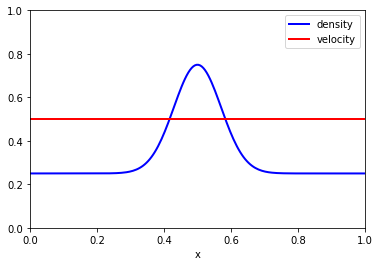

In [24]:
HTML(anim(claw).to_jshtml())

### High Resolution Godunov

In [25]:
claw = solve(rp_solvers.riemann, rho_ini, u_ini, bc="periodic", tfinal=10, order=2)

2019-12-15 20:48:38,802 INFO CLAW: Solution 0 computed for time t=0.000000
2019-12-15 20:48:38,843 INFO CLAW: Solution 1 computed for time t=0.100000
2019-12-15 20:48:38,883 INFO CLAW: Solution 2 computed for time t=0.200000
2019-12-15 20:48:38,921 INFO CLAW: Solution 3 computed for time t=0.300000
2019-12-15 20:48:38,957 INFO CLAW: Solution 4 computed for time t=0.400000
2019-12-15 20:48:38,994 INFO CLAW: Solution 5 computed for time t=0.500000
2019-12-15 20:48:39,035 INFO CLAW: Solution 6 computed for time t=0.600000
2019-12-15 20:48:39,075 INFO CLAW: Solution 7 computed for time t=0.700000
2019-12-15 20:48:39,128 INFO CLAW: Solution 8 computed for time t=0.800000
2019-12-15 20:48:39,200 INFO CLAW: Solution 9 computed for time t=0.900000
2019-12-15 20:48:39,263 INFO CLAW: Solution 10 computed for time t=1.000000
2019-12-15 20:48:39,336 INFO CLAW: Solution 11 computed for time t=1.100000
2019-12-15 20:48:39,418 INFO CLAW: Solution 12 computed for time t=1.200000
2019-12-15 20:48:39,51

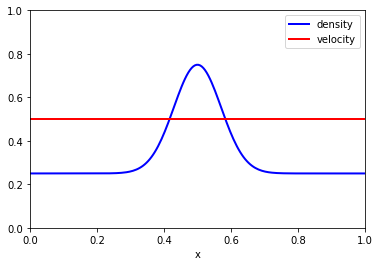

In [26]:
HTML(anim(claw).to_jshtml())

### HLL

In [27]:
claw = solve(rp_solvers.hll, rho_ini, u_ini, bc="periodic", tfinal=10)

2019-12-15 20:49:13,433 INFO CLAW: Solution 0 computed for time t=0.000000
2019-12-15 20:49:13,442 INFO CLAW: Solution 1 computed for time t=0.100000
2019-12-15 20:49:13,455 INFO CLAW: Solution 2 computed for time t=0.200000
2019-12-15 20:49:13,464 INFO CLAW: Solution 3 computed for time t=0.300000
2019-12-15 20:49:13,470 INFO CLAW: Solution 4 computed for time t=0.400000
2019-12-15 20:49:13,478 INFO CLAW: Solution 5 computed for time t=0.500000
2019-12-15 20:49:13,487 INFO CLAW: Solution 6 computed for time t=0.600000
2019-12-15 20:49:13,494 INFO CLAW: Solution 7 computed for time t=0.700000
2019-12-15 20:49:13,503 INFO CLAW: Solution 8 computed for time t=0.800000
2019-12-15 20:49:13,511 INFO CLAW: Solution 9 computed for time t=0.900000
2019-12-15 20:49:13,520 INFO CLAW: Solution 10 computed for time t=1.000000
2019-12-15 20:49:13,529 INFO CLAW: Solution 11 computed for time t=1.100000
2019-12-15 20:49:13,538 INFO CLAW: Solution 12 computed for time t=1.200000
2019-12-15 20:49:13,54

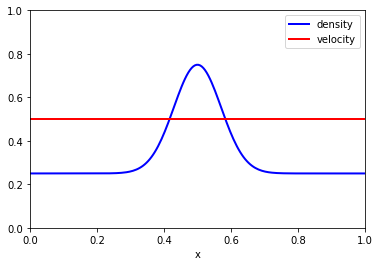

In [28]:
HTML(anim(claw).to_jshtml())

### High Resolution HLL

In [29]:
claw = solve(rp_solvers.hll, rho_ini, u_ini, bc="periodic", tfinal=10, order=2)

2019-12-15 20:49:36,165 INFO CLAW: Solution 0 computed for time t=0.000000
2019-12-15 20:49:36,178 INFO CLAW: Solution 1 computed for time t=0.100000
2019-12-15 20:49:36,196 INFO CLAW: Solution 2 computed for time t=0.200000
2019-12-15 20:49:36,208 INFO CLAW: Solution 3 computed for time t=0.300000
2019-12-15 20:49:36,223 INFO CLAW: Solution 4 computed for time t=0.400000
2019-12-15 20:49:36,237 INFO CLAW: Solution 5 computed for time t=0.500000
2019-12-15 20:49:36,253 INFO CLAW: Solution 6 computed for time t=0.600000
2019-12-15 20:49:36,267 INFO CLAW: Solution 7 computed for time t=0.700000
2019-12-15 20:49:36,280 INFO CLAW: Solution 8 computed for time t=0.800000
2019-12-15 20:49:36,294 INFO CLAW: Solution 9 computed for time t=0.900000
2019-12-15 20:49:36,310 INFO CLAW: Solution 10 computed for time t=1.000000
2019-12-15 20:49:36,329 INFO CLAW: Solution 11 computed for time t=1.100000
2019-12-15 20:49:36,349 INFO CLAW: Solution 12 computed for time t=1.200000
2019-12-15 20:49:36,37

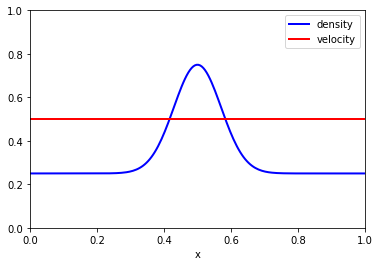

In [30]:
HTML(anim(claw).to_jshtml())

We observe that all four methods exhibit the correct asymptotic behavior that the solution converges to a stop-and-go wave that is a traveling shock. However, the low-resolution methods do not capture the dynamic path from the initial data to the stop-and-go wave. On the contrary, the high-resolution methods can capture the formation and propagation of the second shock wave and the merge between the two waves.